# OMERO and Polarity-JaM 

[OMERO](https://www.openmicroscopy.org/omero/) is a client-server software for visualizing, managing, and annotating microscope images. It is used by many research institutions to store and manage their microscopy data. PolarityJaM can be used to analyze images stored in OMERO. This notebook demonstrates how to connect to an OMERO server, load an image, and analyze it with Polarity-JaM.

## Installation
To use PolarityJaM with OMERO, you need to install the OMERO Python client. You can install it with pip in your environment where Polarity-JaM is installed:
    
    ```bash
    micromamba activate polarityjam
    pip install omero-py
    ```
    
## Connection to OMERO
You can use PolarityJaM with OMERO in the same way as with local images. You need to load the image from OMERO, convert it to a numpy array, and then analyze it with PolarityJaM. 

You might need to adjust the connection parameters to your OMERO server.

In [ ]:
### ADAPT ME ###
HOSTNAME = "myomero.my-domain.net"
PORT = int(4064)
### ADAPT ME ###

In [ ]:
from omero.gateway import BlitzGateway
from getpass import getpass

# connect to omero
conn = BlitzGateway(
    input("Username: "), getpass("Password: "), host=HOSTNAME, port=PORT, secure=True
)
conn.connect()

## User and Group Information

Sometimes you need to know which groups the user is a member of or switch the group to access the images. You can get this information with the following commands.

In [ ]:
print("Groups the user is a member of:")
for g in conn.getGroupsMemberOf():
    print("Group: %s \tID: %s" % (g.getName(), g.getId()))
print(f"Current group: {conn.getGroupFromContext().getName()}")

# switch group
conn.setGroupForSession(203)
print(f"Current group: {conn.getGroupFromContext().getName()}")

## Load Image from Omero

You can load an image from OMERO with the image ID. You can find the image ID in the OMERO web interface. Here we load our example image.

In [24]:
img_060721_EGM2_18dyn_02_omero_id = 30618

img_omero = conn.getObject("Image", img_060721_EGM2_18dyn_02_omero_id)

In [25]:
assert img_omero is not None, "Image not found"

Lets check the image shape and convert it to a numpy array.

<_ImageWrapper id=30618>
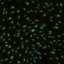

In [26]:
img_omero

In [27]:
import numpy as np
from pathlib import Path

# get image shape
shape = img_omero.getSizeZ(), img_omero.getSizeT(), img_omero.getSizeC(), img_omero.getSizeX(), img_omero.getSizeY()
print("Image shape: ZTCXY", shape)

# convert to numpy array
pxls = img_omero.getPrimaryPixels()
img = np.zeros([img_omero.getSizeX(), img_omero.getSizeY(), img_omero.getSizeC()])
for i in range(img_omero.getSizeC()):
    img[:, :, i] = pxls.getPlane(0, i, 0)

print("Numpy Image shape: ", img.shape)

Image shape: ZTCXY (1, 1, 4, 1024, 1024)
Numpy Image shape:  (1024, 1024, 4)


In [ ]:
### ADAPT ME ###
path_root = Path("")
output_path = path_root.joinpath("polarityjam_out")
### ADAPT ME ###

In [ ]:
input_file = img_omero.getName()
output_file_prefix = Path(input_file).stem

print("Input file: ", input_file)
print("Output path: ", output_path)
print("Output file prefix: ", output_file_prefix)

## Analysis

Lets analyze the image with PolarityJaM. We first need to define the parameters for the image, runtime, and plotting. Then we can segment the image and extract features to finally plot the results.

<div class="alert alert-info">

Note

This part is similar to the local analysis. See the notebook [PolarityJaM](polarityjam-notebook.ipynb) for more details.

</div>

In [29]:
# must run in an environment where polarityJaM and omero-py is installed
from polarityjam import Extractor, Plotter, PropertiesCollection
from polarityjam import RuntimeParameter, PlotParameter, ImageParameter
from polarityjam import PolarityJamLogger
from polarityjam import load_segmenter

plog = PolarityJamLogger("WARNING")

# describe your image with ImageParameter
params_image = ImageParameter()

# set the channels
params_image.channel_organelle = 0  # golgi channel
params_image.channel_nucleus = 2
params_image.channel_junction = 3
params_image.channel_expression_marker = 3
params_image.pixel_to_micron_ratio = 2.4089

# define other parameters, use default values
params_runtime = RuntimeParameter()
params_plot = PlotParameter()

# change some parameters
params_runtime.membrane_thickness = 6
params_runtime.min_organelle_size = 9

print(params_image)
print(params_runtime)
print(params_plot)

ImageParameter:  
channel_junction              3                                       
channel_nucleus               2                                       
channel_organelle             0                                       
channel_expression_marker     3                                       
pixel_to_micron_ratio         2.4089                                  

RuntimeParameter:  
extract_group_features        False                                   
membrane_thickness            6                                       
junction_threshold            -1                                      
feature_of_interest           cell_area                               
min_cell_size                 50                                      
min_nucleus_size              10                                      
min_organelle_size            9                                       
dp_epsilon                    5                                       
cue_direction                 0       

In [30]:
print("Used algorithm for segmentation: %s " % params_runtime.segmentation_algorithm)

Used algorithm for segmentation: CellposeSegmenter 


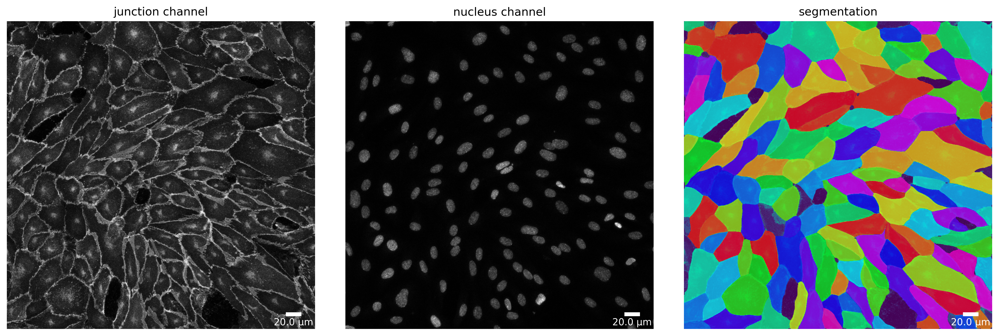

In [14]:
# Now define your segmenter and segment your image with the default algorithm and default parameters.
cellpose_segmentation, _ = load_segmenter(params_runtime)

# prepare your image for segmentation
img_prepared, img_prepared_params = cellpose_segmentation.prepare(img, params_image)

# now segment your prepared image to get the masks
mask = cellpose_segmentation.segment(img_prepared, input_file)

# plot segmentation mask to check the quality
plotter = Plotter(params_plot)
plotter.plot_mask(mask, img_prepared, img_prepared_params, output_path, output_file_prefix);

In [15]:
# feature extraction
collection = PropertiesCollection()
extractor = Extractor(params_runtime)
extractor.extract(img, params_image, mask, output_file_prefix, output_path, collection);

In [16]:
collection.dataset.head()

,filename,img_hash,label,cell_X,cell_Y,cell_shape_orientation_rad,cell_shape_orientation_deg,cell_major_axis_length,cell_minor_axis_length,cell_eccentricity,...,junction_perimeter,junction_protein_area,junction_mean_expression,junction_protein_intensity,junction_interface_linearity_index,junction_interface_occupancy,junction_intensity_per_interface_area,junction_cluster_density,junction_cue_directional_intensity_ratio,junction_cue_axial_intensity_ratio
1,060721_EGM2_18dyn_02,99b1548d1d7368b24afd215aa00c0506a0f31434,11.0,721.049684,44.831045,3.115089,178.481461,148.218110,57.849774,0.920687,...,356.551299,2243.0,317.373711,995720.0,1.050856,0.578093,256.628866,443.923317,0.076623,0.516027
2,060721_EGM2_18dyn_02,99b1548d1d7368b24afd215aa00c0506a0f31434,12.0,57.170727,55.504237,0.007508,0.430191,99.033516,76.261338,0.637976,...,315.563492,1793.0,242.299719,619673.0,1.085897,0.559788,193.466438,345.606804,-0.282458,0.587275
3,060721_EGM2_18dyn_02,99b1548d1d7368b24afd215aa00c0506a0f31434,13.0,619.520117,70.120408,2.742737,157.147232,102.321920,89.083348,0.491959,...,334.534055,2079.0,267.149868,736250.0,1.070077,0.610932,216.353218,354.136604,-0.131366,0.428645
4,060721_EGM2_18dyn_02,99b1548d1d7368b24afd215aa00c0506a0f31434,14.0,176.148852,105.566653,0.422114,24.185359,187.633346,145.493784,0.631451,...,609.126984,2496.0,227.167310,1017159.0,1.065744,0.401544,163.635618,407.515625,-0.262354,0.540647
5,060721_EGM2_18dyn_02,99b1548d1d7368b24afd215aa00c0506a0f31434,15.0,822.559345,71.767302,2.477095,141.927109,75.120572,52.348251,0.717211,...,224.651804,1793.0,389.570198,816943.0,1.055555,0.772179,351.827304,455.629113,-0.024172,0.541412


In [17]:
collection.dataset.to_csv(output_path.joinpath('features.csv'))

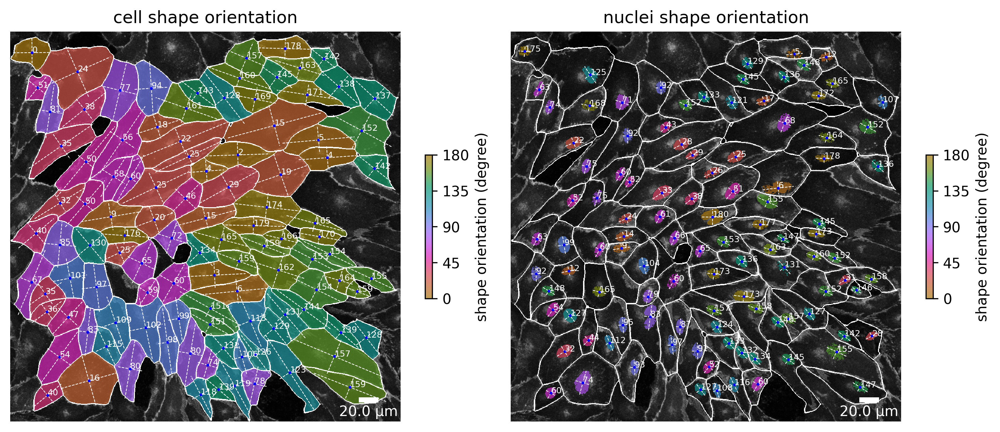

In [18]:
# plot the cell orientation
plotter.plot_shape_orientation(collection, "060721_EGM2_18dyn_02");  # image is automatically saved in output_path